# Data Cleaning - Training Data

Columns definitions from DrivenData;


    amount_tsh - Total static head (amount water available to waterpoint)
    date_recorded - The date the row was entered
    funder - Who funded the well
    gps_height - Altitude of the well
    installer - Organization that installed the well
    longitude - GPS coordinate
    latitude - GPS coordinate
    wpt_name - Name of the waterpoint if there is one
    num_private -
    basin - Geographic water basin
    subvillage - Geographic location
    region - Geographic location
    region_code - Geographic location (coded)
    district_code - Geographic location (coded)
    lga - Geographic location
    ward - Geographic location
    population - Population around the well
    public_meeting - True/False
    recorded_by - Group entering this row of data
    scheme_management - Who operates the waterpoint
    scheme_name - Who operates the waterpoint
    permit - If the waterpoint is permitted
    construction_year - Year the waterpoint was constructed
    extraction_type - The kind of extraction the waterpoint uses
    extraction_type_group - The kind of extraction the waterpoint uses
    extraction_type_class - The kind of extraction the waterpoint uses
    management - How the waterpoint is managed
    management_group - How the waterpoint is managed
    payment - What the water costs
    payment_type - What the water costs
    water_quality - The quality of the water
    quality_group - The quality of the water
    quantity - The quantity of water
    quantity_group - The quantity of water
    source - The source of the water
    source_type - The source of the water
    source_class - The source of the water
    waterpoint_type - The kind of waterpoint
    waterpoint_type_group - The kind of waterpoint


In [73]:
import numpy as np
import pandas as pd
import ydata_profiling as ydata_profiling
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf

sns.set_palette("icefire")
plt.show()

In [74]:
 # Function to view all columns/rows

def display_all(df):
   with pd.option_context('display.max_rows', 1000):
       with pd.option_context('display.max_columns', 1000):
           display(df)

In [75]:
df_train = pd.read_csv("trainSet-indep.csv")
df_label = pd.read_csv("trainSet-depend.csv")

df = pd.concat([df_train,df_label['status_group']],axis=1)


<AxesSubplot:xlabel='status_group', ylabel='count'>

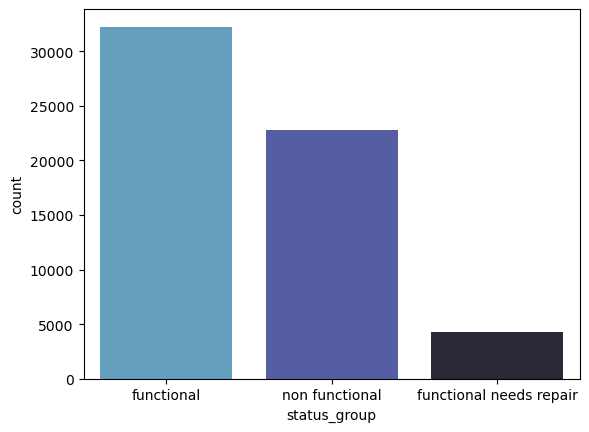

In [76]:
df_train.shape       
sns.countplot(x='status_group', data=df)

In [77]:
display_all(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55765 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

None

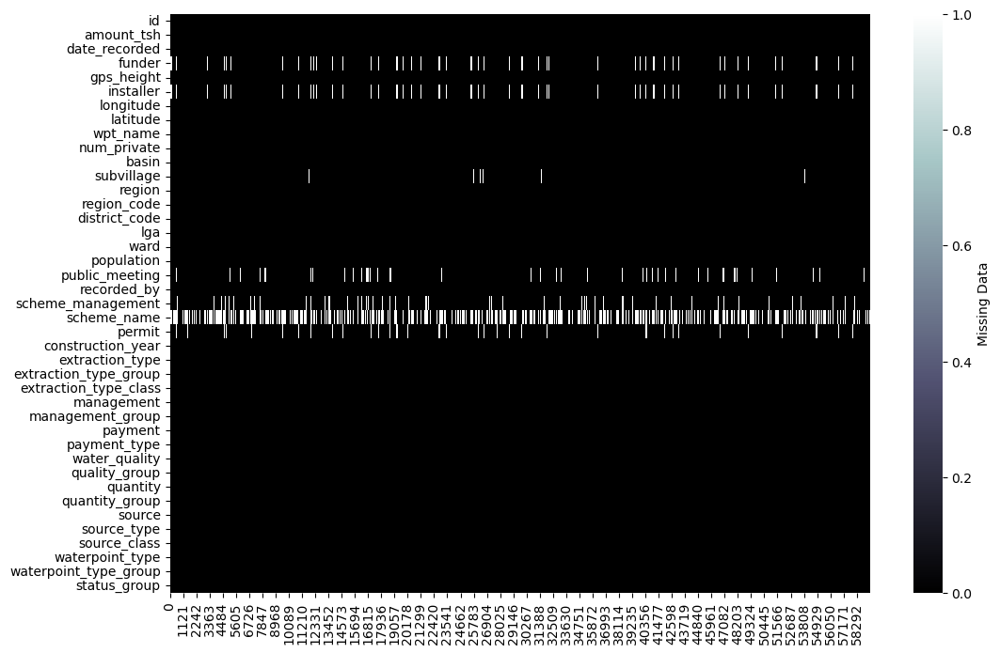

In [78]:
plt.figure(figsize=(12,8))

sns.heatmap(df.isna().transpose(), cmap="bone", cbar_kws={'label': 'Missing Data'})

plt.show()

In [79]:
display_all(df.isnull().sum().sort_index()/len(df)*100)

amount_tsh                0.000000
basin                     0.000000
construction_year         0.000000
date_recorded             0.000000
district_code             0.000000
extraction_type           0.000000
extraction_type_class     0.000000
extraction_type_group     0.000000
funder                    6.119529
gps_height                0.000000
id                        0.000000
installer                 6.153199
latitude                  0.000000
lga                       0.000000
longitude                 0.000000
management                0.000000
management_group          0.000000
num_private               0.000000
payment                   0.000000
payment_type              0.000000
permit                    5.144781
population                0.000000
public_meeting            5.612795
quality_group             0.000000
quantity                  0.000000
quantity_group            0.000000
recorded_by               0.000000
region                    0.000000
region_code         

Funder, Installer, Permit, Public Meeting, Scheme Management columns seems to have 5-6% missing.

Subvillage data is only 0.6% missing.

Scheme_name is 47% missing -- this will be dropped.

## DATA EXPLORATION AND IMPUTATION

Understanding Qualitative and Quantitative Data

In [80]:
df.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000000,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,668.297239,34.077427,-5.706033e+00,0.474141,15.297003,5.629747,179.909983,1300.652475
std,21453.128371,2997.574558,693.116350,6.567432,2.946019e+00,12.236230,17.587406,9.633649,471.482176,951.620547
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18519.750000,0.000000,0.000000,33.090347,-8.540621e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37061.500000,0.000000,369.000000,34.908743,-5.021597e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,55656.500000,20.000000,1319.250000,37.178387,-3.326156e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


In [81]:
display_all(df.describe(include=object))

,date_recorded,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,recorded_by,scheme_management,scheme_name,permit,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
count,59400,55765,55745,59400,59400,59029,59400,59400,59400,56066,59400,55523,31234,56344,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400
unique,356,1897,2145,37400,9,19287,21,125,2092,2,1,12,2696,2,18,13,7,12,5,7,7,8,6,5,5,10,7,3,7,6,3
top,2011-03-15,Government Of Tanzania,DWE,none,Lake Victoria,Madukani,Iringa,Njombe,Igosi,True,GeoData Consultants Ltd,VWC,K,True,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
freq,572,9084,17402,3563,10248,508,5294,2503,307,51011,59400,36793,682,38852,26780,26780,26780,40507,52490,25348,25348,50818,50818,33186,33186,17021,17021,45794,28522,34625,32259


In [82]:
ydata_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

From the report of Ydata Profiling and describe methods we see that;

- Recorded By has only one constant value, thus will be discarded.

- Date_recorded is a string of date. This will be transformed into seperate YYYY DD MM columns for better analysis.

- Funder, Installer, WPT-Name (waterpoint name) has high number of unique values (High cardinality). Thus will be removed in order to prevent cluttered columns.

- Longitude/Latitude are numerical location data whereas Subvillage, LGA, Ward, Region, Basin are categorical location data. 
Longitude high number of zero values (wrong, this had yielded an absurd chart in Geopandas, resulted as if location is on ocean). Thus, these will be replaced by NaN.
Latitude has high number of -2*10^-8 values, which probably is not correct as in Ydata Report this seems like an outlier. Thus, these will be replaced by NaN.
We will use categorical regional data to group the dataframe with them and provide mean values of each group to NaN's. Then will remove the categoric location columns.

- Population has high number of zero and one values. These will be replaced by NaN values, will be imputed in the same manner as Longitude/Latitude, since Population of a zone can be inferred by location, logically.

- GPS Height has 34% of zeros. These will be imputed in the same manner as Longitude, Latitude because height of a zone again can be inferred by location data.

- Construction Year has 34.9% zeros. This will be imputed by random distribution.




#### Correcting Longitude, Latitude, GPS Height and Population Using Location-Based Categoric Data Columns

##### Longitude

<AxesSubplot:xlabel='longitude', ylabel='Count'>

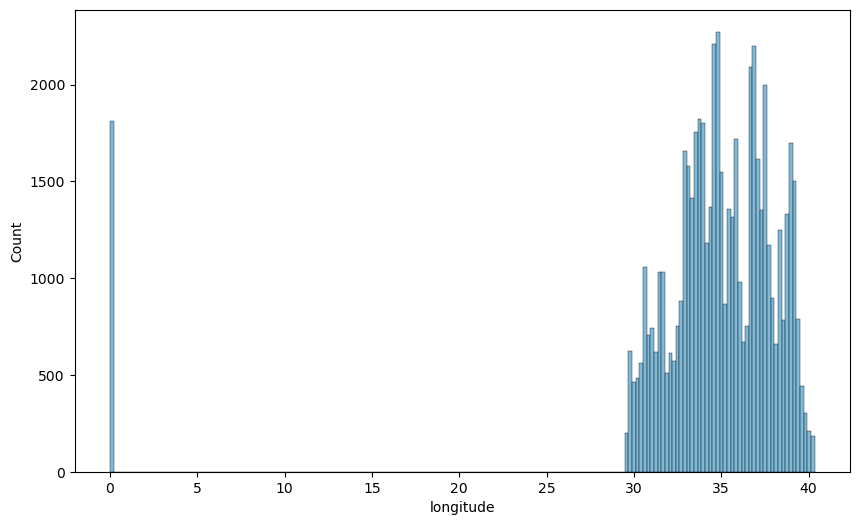

In [83]:
plt.figure(figsize=(10, 6))
sns.histplot(df.longitude)


In [84]:
len(df.longitude), df.longitude.isna().sum(), df.longitude.isnull().sum(), df.longitude.value_counts()[0]

(59400, 0, 0, 1812)

<AxesSubplot:xlabel='longitude', ylabel='Count'>

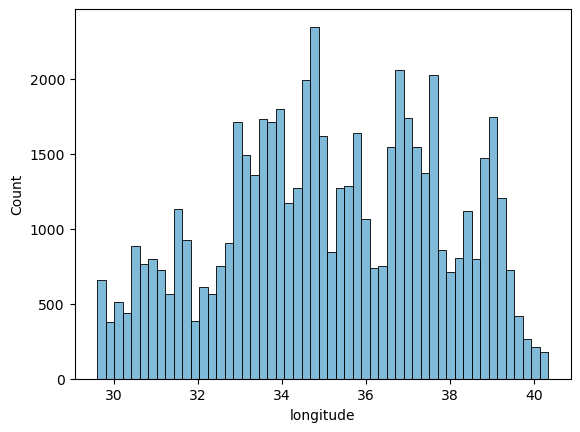

In [85]:
df['longitude']=df['longitude'].replace(0,np.nan)
len(df.longitude), df.longitude.isna().sum(), df.longitude.isnull().sum()
sns.histplot(df.longitude)

In [86]:
len(df.longitude), df.longitude.isna().sum(), df.longitude.isnull().sum()

(59400, 1812, 1812)

<AxesSubplot:xlabel='longitude', ylabel='Count'>

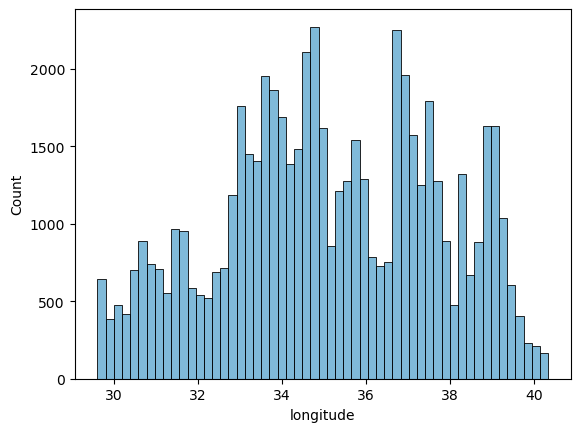

In [87]:
df['longitude'] = df['longitude'].fillna(df.groupby(['basin', 'region', 'lga', 'ward', 'subvillage'])['longitude'].transform('mean'))
df['longitude'] = df['longitude'].fillna(df.groupby(['subvillage'])['longitude'].transform('mean'))
df['longitude'] = df['longitude'].fillna(df.groupby(['basin', 'region', 'lga', 'ward'])['longitude'].transform('mean'))
df['longitude'] = df['longitude'].fillna(df.groupby(['ward'])['longitude'].transform('mean'))
df['longitude'] = df['longitude'].fillna(df.groupby(['basin', 'region', 'lga'])['longitude'].transform('mean'))

sns.histplot(df.longitude)


In [88]:
len(df.longitude), df.longitude.isna().sum(), df.longitude.isnull().sum()

(59400, 0, 0)

- The reason that second grouping only has subvillage is that it will be removed in the next iteration of group based imputation. Starting by the category of highest number of unique values, each category will be removed one by one. However, prior to removal of a specific column, we group the data by the column in question and fill by the means of target column (this case, longitude). This has yielded better distributions.

##### Latitude

<AxesSubplot:xlabel='latitude', ylabel='Count'>

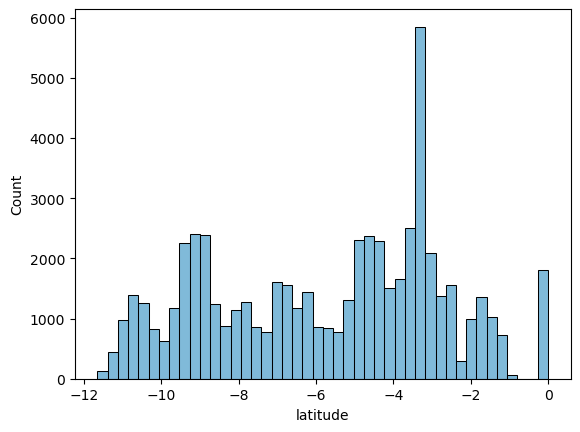

In [89]:
sns.histplot(df.latitude)

In [90]:
len(df.latitude), df.latitude.isna().sum(), df.latitude.isnull().sum()

(59400, 0, 0)

<AxesSubplot:xlabel='latitude', ylabel='Count'>

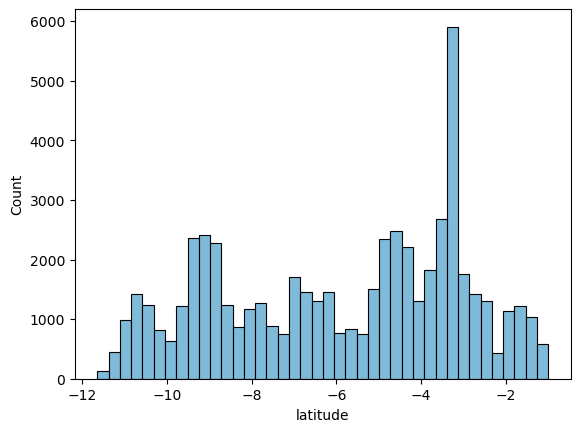

In [91]:
df['latitude']=df['latitude'].replace(-2.000000e-08,np.nan)
sns.histplot(df.latitude)

In [92]:
df.latitude.value_counts()

-2.465246     2
-7.103742     2
-6.958716     2
-6.978322     2
-7.095131     2
             ..
-3.287619     1
-8.234989     1
-3.268579     1
-11.460531    1
-6.747464     1
Name: latitude, Length: 57516, dtype: int64

- The peak in between -4 and -2 latitude has no abnormality as we checked value_counts() and this is merely a coincidence that many locations lie in that bin.

<AxesSubplot:xlabel='latitude', ylabel='Count'>

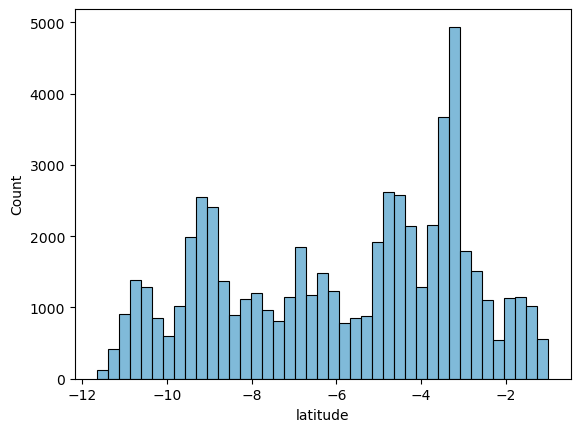

In [93]:
df['latitude'] = df['latitude'].fillna(df.groupby(['basin', 'region', 'lga', 'ward', 'subvillage'])['latitude'].transform('mean'))
df['latitude'] = df['latitude'].fillna(df.groupby(['subvillage'])['latitude'].transform('mean'))
df['latitude'] = df['latitude'].fillna(df.groupby(['basin', 'region', 'lga','ward'])['latitude'].transform('mean'))
df['latitude'] = df['latitude'].fillna(df.groupby(['ward'])['latitude'].transform('mean'))
df['latitude'] = df['latitude'].fillna(df.groupby(['basin', 'region','lga'])['latitude'].transform('mean'))
sns.histplot(df.latitude)

In [94]:
len(df.latitude), df.latitude.isna().sum(), df.latitude.isnull().sum()

(59400, 0, 0)

In [95]:
df.latitude.value_counts()

-3.800008     93
-4.601249     66
-4.937702     58
-4.493470     48
-3.347797     47
              ..
-10.297018     1
-7.812460      1
-7.398355      1
-6.924400      1
-6.747464      1
Name: latitude, Length: 57761, dtype: int64

##### GPS Height

<AxesSubplot:xlabel='gps_height', ylabel='Count'>

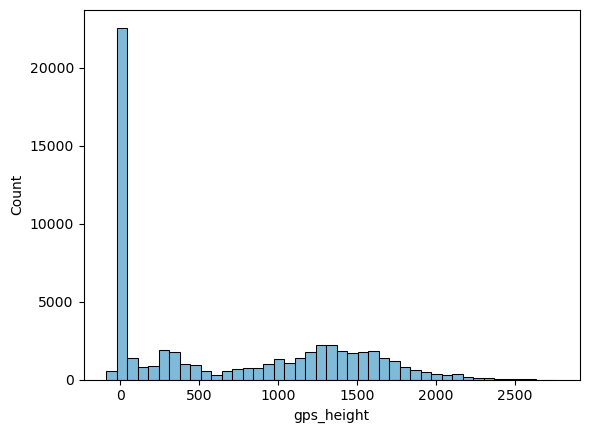

In [96]:
sns.histplot(df.gps_height)

In [97]:
len(df.gps_height), df.gps_height.isna().sum(), df.gps_height.isnull().sum(), df['gps_height'].value_counts()[0]

(59400, 0, 0, 20438)

<AxesSubplot:xlabel='gps_height', ylabel='Count'>

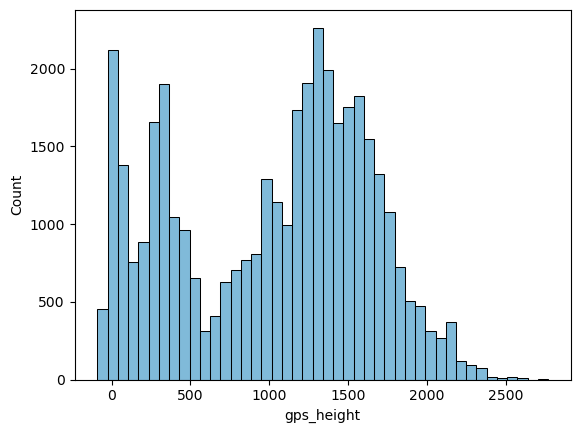

In [98]:
#Trying to correct the GPS Height, since it has too much zeros.
df['gps_height']=df['gps_height'].replace(0,np.nan)
sns.histplot(df.gps_height)

In [99]:
len(df.gps_height), df.gps_height.isna().sum(), df.gps_height.isnull().sum()

(59400, 20438, 20438)

<AxesSubplot:xlabel='gps_height', ylabel='Count'>

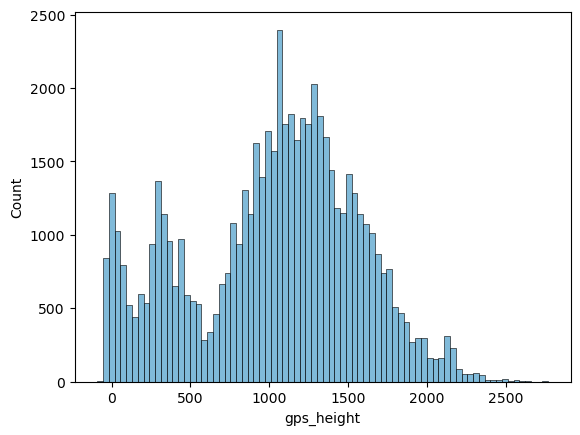

In [100]:
df['gps_height'] = df['gps_height'].fillna(df.groupby(['basin', 'region', 'lga', 'ward', 'subvillage'])['gps_height'].transform('mean'))
df['gps_height'] = df['gps_height'].fillna(df.groupby(['subvillage'])['gps_height'].transform('mean'))
df['gps_height'] = df['gps_height'].fillna(df.groupby(['basin', 'region', 'lga', 'ward'])['gps_height'].transform('mean'))
df['gps_height'] = df['gps_height'].fillna(df.groupby(['ward'])['gps_height'].transform('mean'))
df['gps_height'] = df['gps_height'].fillna(df.groupby(['basin', 'region', 'lga'])['gps_height'].transform('mean'))
df['gps_height'] = df['gps_height'].fillna(df.groupby(['lga'])['gps_height'].transform('mean'))
df['gps_height'] = df['gps_height'].fillna(df.groupby(['basin', 'region'])['gps_height'].transform('mean'))
sns.histplot(df.gps_height)

In [101]:
len(df.gps_height), df.gps_height.isna().sum(), df.gps_height.isnull().sum()

(59400, 0, 0)

In [102]:
df.gps_height.value_counts()

1068.000000    383
449.496680     294
1101.445611    262
1288.802529    261
1067.306869    258
              ... 
19.400000        1
470.833333       1
2353.000000      1
768.363636       1
2366.000000      1
Name: gps_height, Length: 3415, dtype: int64

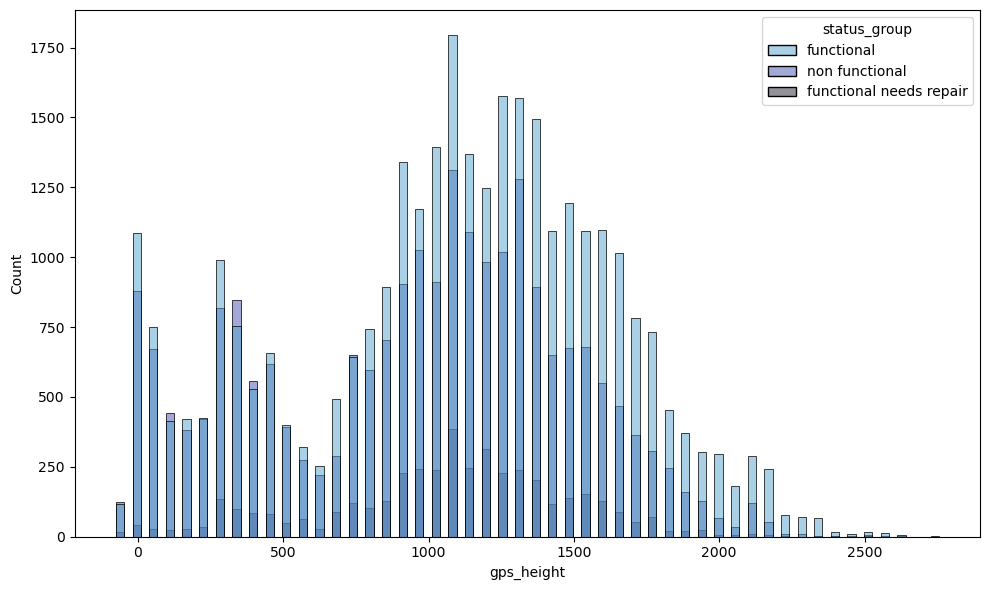

In [103]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x="gps_height", hue="status_group", bins=50, shrink=0.5)

plt.tight_layout()
plt.show()

In lower heights of Tanzania the ratio of non functional pumps are higher than higher ratios. The functionality between 1000 and 2000 is better.

<AxesSubplot:xlabel='latitude', ylabel='longitude'>

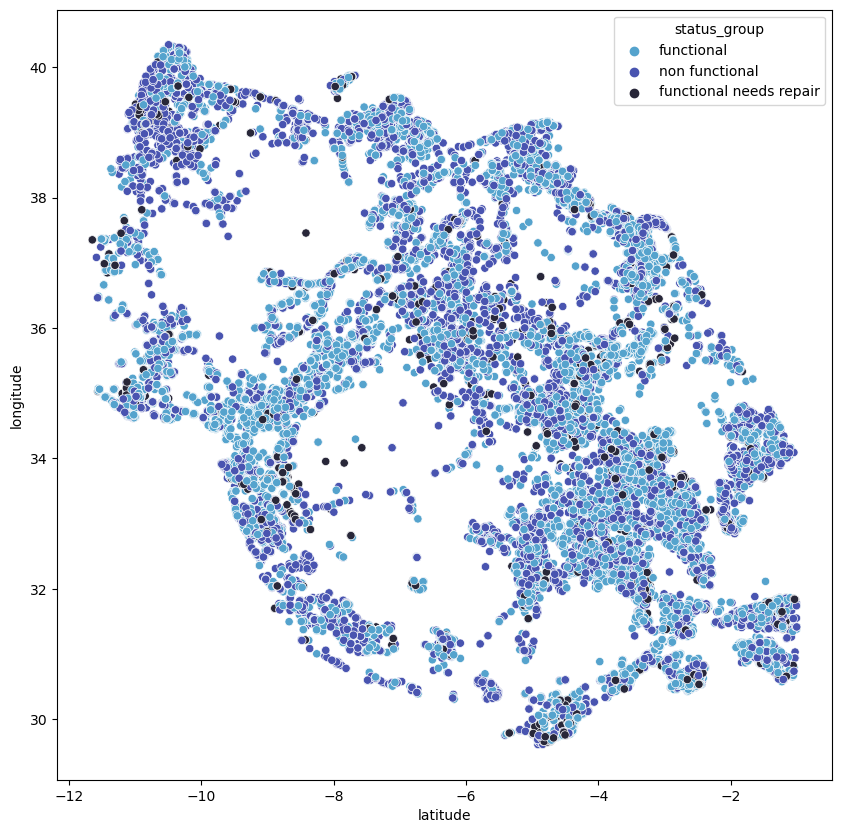

In [104]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.scatterplot(data=df, x='latitude', y='longitude',
                hue='status_group', ax=ax)

##### Population

<AxesSubplot:xlabel='population', ylabel='Count'>

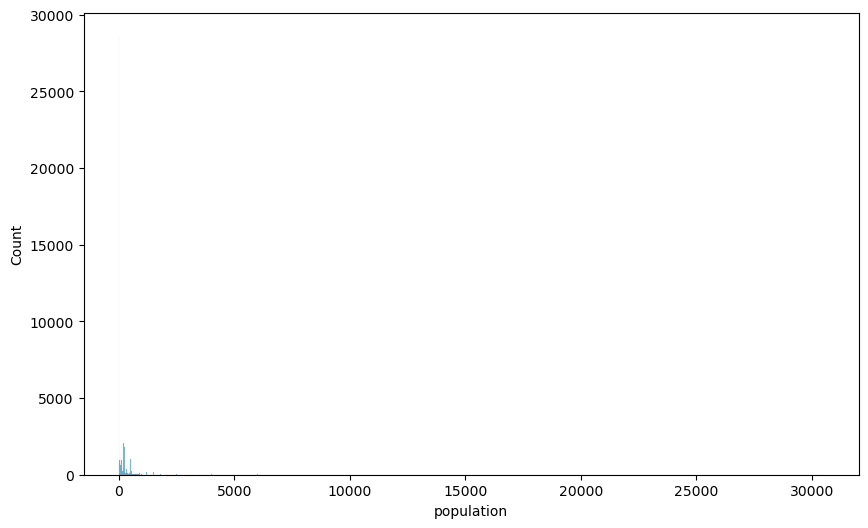

In [105]:
plt.figure(figsize=(10,6))
sns.histplot(df.population)

In [106]:
display_all(df.population.value_counts())

0       21381
1        7025
200      1940
150      1892
250      1681
        ...  
6330        1
5030        1
656         1
948         1
788         1
Name: population, Length: 1049, dtype: int64

- Very high number of zeros and ones exist in the population data. These will be removed and imputed by categoric-location data based group means, same as before.

In [107]:
#Too many zeros and ones. Will be replaced by NaN.
df['population']=df['population'].replace(0,np.nan)
df['population']=df['population'].replace(1,np.nan)

<AxesSubplot:xlabel='population', ylabel='Count'>

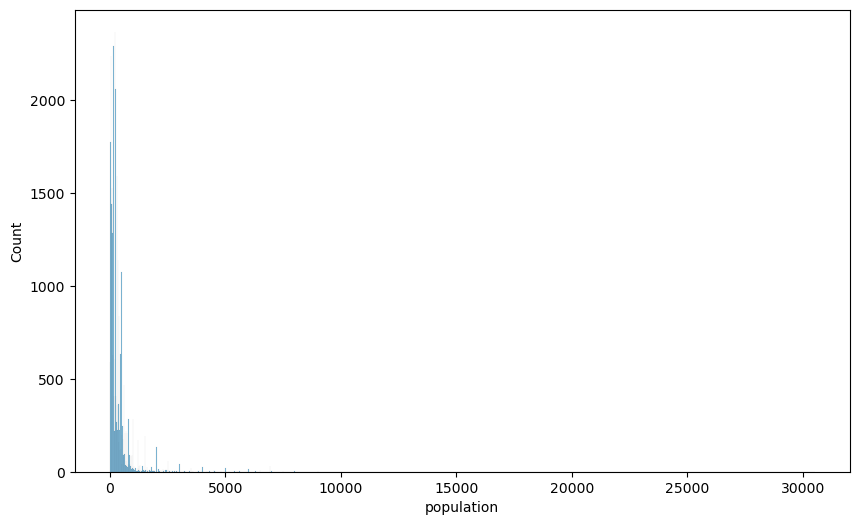

In [108]:
plt.figure(figsize=(10,6))
sns.histplot(df.population)

In [109]:
len(df.population), df.population.isna().sum(), df.population.isnull().sum()

(59400, 28406, 28406)

<AxesSubplot:xlabel='population', ylabel='Count'>

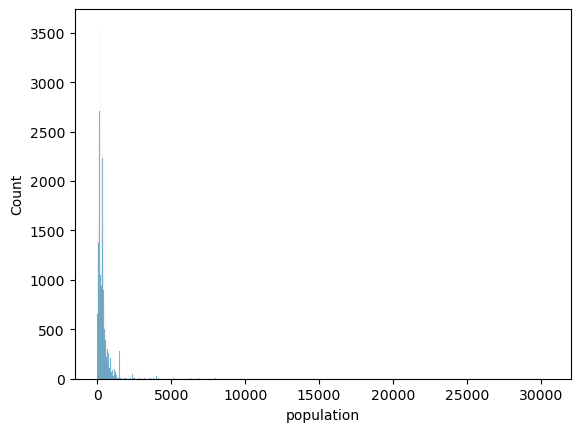

In [110]:
#Same as Long/Latitude/GPS Height correction; imputing the Population data.
df['population'] = df['population'].fillna(df.groupby(['basin', 'region', 'lga', 'ward', 'subvillage'])['population'].transform('mean'))
df['population'] = df['population'].fillna(df.groupby(['subvillage'])['population'].transform('mean'))
df['population'] = df['population'].fillna(df.groupby(['basin', 'region', 'lga', 'ward'])['population'].transform('mean'))
df['population'] = df['population'].fillna(df.groupby(['ward'])['population'].transform('mean'))
df['population'] = df['population'].fillna(df.groupby(['basin', 'region', 'lga'])['population'].transform('mean'))
df['population'] = df['population'].fillna(df.groupby(['lga'])['population'].transform('mean'))
df['population'] = df['population'].fillna(df.groupby(['basin', 'region'])['population'].transform('mean'))
sns.histplot(df.population)

In [111]:
len(df.population), df.population.isna().sum(), df.population.isnull().sum()

(59400, 0, 0)

#### Imputation of Construction Year with Probability Distribution

In [112]:
#Same for Construction Year since it has so many 0's.
df['construction_year']=df['construction_year'].replace(0,np.nan)

# Compute the probability distribution of the construction year variable
year_counts = df['construction_year'].value_counts()
year_probs = year_counts / year_counts.sum()

# Normalize the probability distribution
year_cumsum = year_probs.cumsum()
year_percentiles = year_cumsum.values

# Replace missing values with random samples drawn from the normalized probability distribution
missing_mask = df['construction_year'].isnull()
missing_count = missing_mask.sum()
missing_percentiles = np.random.uniform(size=missing_count)
missing_years = np.interp(missing_percentiles, year_percentiles, year_cumsum.index)
df.loc[missing_mask, 'construction_year'] = missing_years

In [113]:
def construction_year_chng(row):
    if row['construction_year'] >= 1960 and row['construction_year'] < 1970:
        return '1960s'
    elif row['construction_year'] >= 1970 and row['construction_year'] < 1980:
        return '1970s'
    elif row['construction_year'] >= 1980 and row['construction_year'] < 1990:
        return '1980s'
    elif row['construction_year'] >= 1990 and row['construction_year'] < 2000:
        return '1990s'
    elif row['construction_year'] >= 2000 and row['construction_year'] < 2010:
        return '2000s'
    elif row['construction_year'] >= 2010:
        return '2010s'
    else:
        return 'unknown'


df['construction_year'] = df.apply(
    lambda row: construction_year_chng(row), axis=1)

df['construction_year'].value_counts()


2000s    24476
1990s    11333
1980s     9627
2010s     7065
1970s     6083
1960s      816
Name: construction_year, dtype: int64

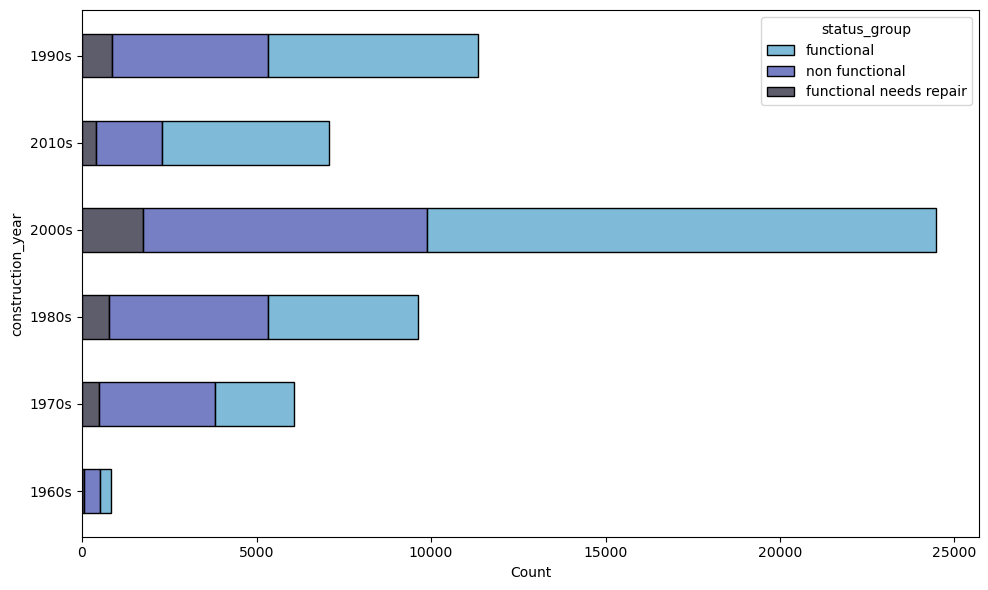

In [114]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, y="construction_year",
             hue="status_group", multiple="stack", shrink=0.5)

plt.tight_layout()
plt.show()

Let's explore the date_recorded data. We will split the string data into three numeric columns for better data manipulation.

In [115]:
df['date_recorded']=pd.to_datetime(df['date_recorded'],format='%Y-%m-%d')
df['recordDay']=df['date_recorded'].dt.day
df['recordMonth']=df['date_recorded'].dt.month
df['recordYear']=df['date_recorded'].dt.year
df.drop(['date_recorded'],axis=1,inplace=True)

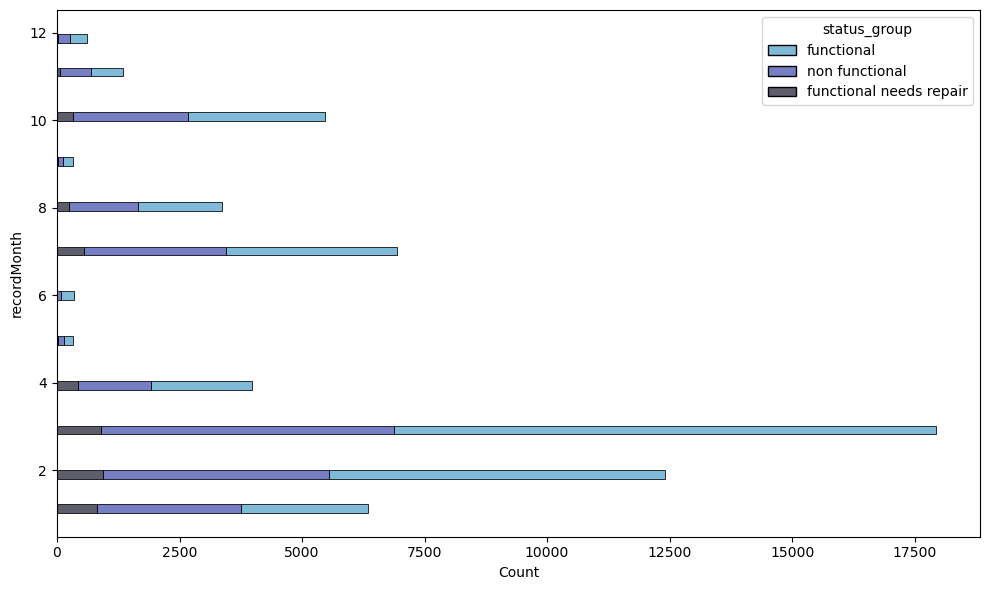

In [116]:

plt.figure(figsize=(10, 6))
sns.histplot(data=df, y="recordMonth", hue="status_group",
             multiple="stack", shrink=0.8)

plt.tight_layout()
plt.show()

The ratio of functional water pumps in spring season records is slightly higher than other months.

Lets look at payment data.

In [117]:
df.payment.value_counts()

never pay                25348
pay per bucket            8985
pay monthly               8300
unknown                   8157
pay when scheme fails     3914
pay annually              3642
other                     1054
Name: payment, dtype: int64

We can convert payment data to binary where never pay is 0, and other cases as 1.

In [118]:
df['payment']=df['payment'].replace("never pay",0)
df['payment']=df['payment'].replace("unknown",np.nan)
df['payment']=df['payment'].replace("pay per bucket",1)
df['payment']=df['payment'].replace("pay monthly",1)
df['payment']=df['payment'].replace("pay when scheme fails",1)
df['payment']=df['payment'].replace("pay annually",1)
df['payment']=df['payment'].replace("other",1)

In [119]:
df.payment.isnull().sum()/len(df)

0.13732323232323232

13% of payment remains unknown. Imputing the data with random samples from the normalized probability distribution;

In [120]:
# Compute the probability distribution of payment variable
pay_counts = df['payment'].value_counts()
pay_probs = pay_counts / pay_counts.sum()

# Normalize the probability distribution
pay_cumsum = pay_probs.cumsum()
pay_percentiles = pay_cumsum.values

# Replace missing values with random samples drawn from the normalized probability distribution
missing_mask = df['payment'].isnull()
missing_count = missing_mask.sum()
missing_percentiles = np.random.uniform(size=missing_count)
missing_pay = np.interp(missing_percentiles, pay_percentiles, pay_cumsum.index)
df.loc[missing_mask, 'payment'] = missing_pay

In [121]:
#Replacing values above 0.5 with 1 and others with 0. 

replace_w1_mask = df['payment']>=0.5
df.loc[replace_w1_mask, 'payment'] = 1
replace_w0_mask = df['payment']<0.5
df.loc[replace_w0_mask, 'payment'] = 0


In [122]:
df.payment.value_counts()

1.0    32014
0.0    27386
Name: payment, dtype: int64

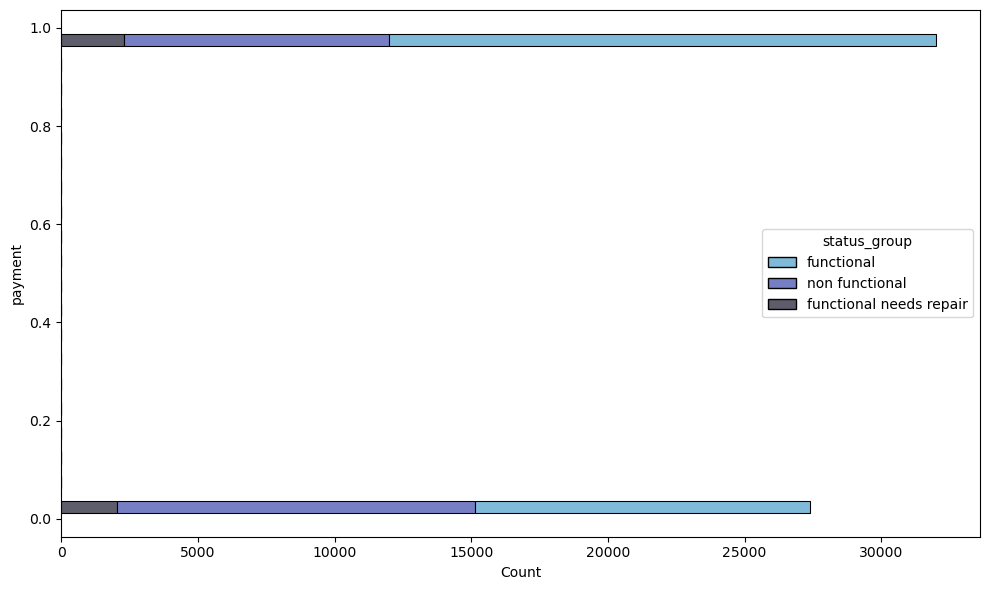

In [123]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, y="payment",
             hue="status_group", multiple="stack", shrink=0.5)

plt.tight_layout()
plt.show()

The ratio of funcitonal water pumps with payment is higher than no payment.

#### Lets look at permit, public meeting, scheme management.

Permit, Public Meeting has 5-5.5% missing values. Scheme Management has 6.52% missing values. All three are object type columns. Prior to any manipulation, lets take a look at any correlation.

In [124]:
display_all(df.describe(include=object))

,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
count,55765,55745,59400,59400,59029,59400,59400,59400,56066,59400,55523,31234,56344,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400
unique,1897,2145,37400,9,19287,21,125,2092,2,1,12,2696,2,6,18,13,7,12,5,7,8,6,5,5,10,7,3,7,6,3
top,Government Of Tanzania,DWE,none,Lake Victoria,Madukani,Iringa,Njombe,Igosi,True,GeoData Consultants Ltd,VWC,K,True,2000s,gravity,gravity,gravity,vwc,user-group,never pay,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
freq,9084,17402,3563,10248,508,5294,2503,307,51011,59400,36793,682,38852,24476,26780,26780,26780,40507,52490,25348,50818,50818,33186,33186,17021,17021,45794,28522,34625,32259


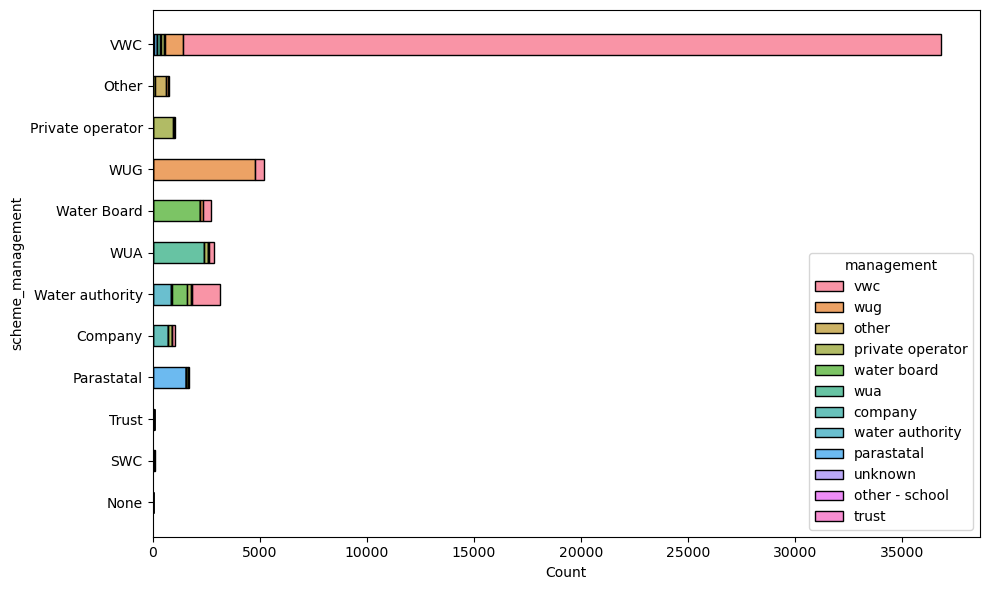

In [125]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, y="scheme_management",
             hue="management", multiple="stack", shrink=0.5)

plt.tight_layout()
plt.show()

This chart yields that for scheme_management is highly corrolated with management with a few exceptions. Therefore, we can froup by management and fill by mode.

In [126]:
# Group the dataframe by management and fill missing values in column scheme_management with the mode of each group
df['scheme_management'] = df.groupby('management')['scheme_management'].apply(lambda x: x.fillna(x.mode()[0]))

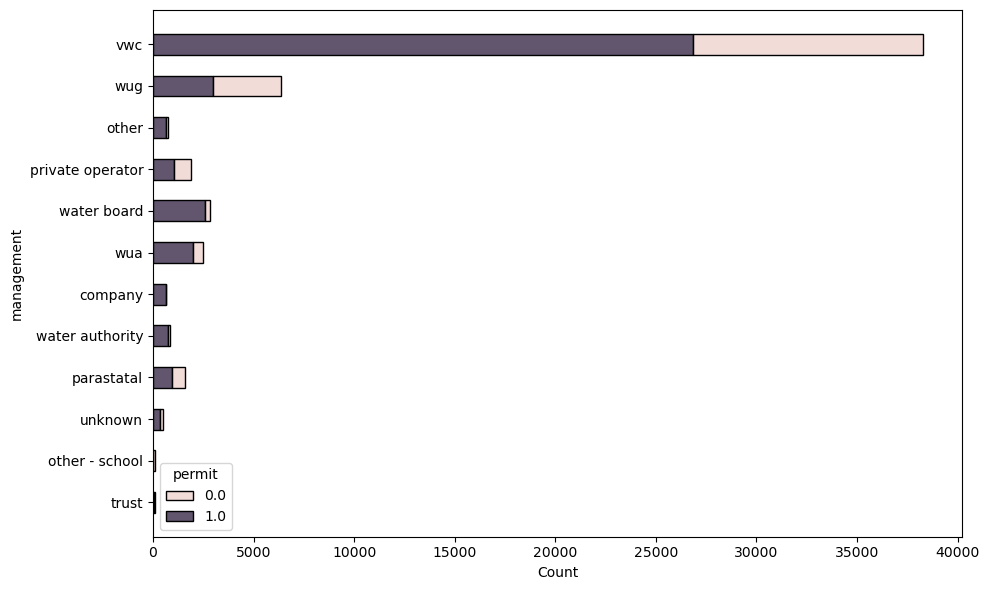

In [127]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, y="management",
             hue="permit", multiple="stack", shrink=0.5)

plt.tight_layout()
plt.show()

It seems we can do the above to permit as well.

In [128]:
# Group the dataframe by management and fill missing values in column scheme_management with the mode of each group
df['permit'] = df.groupby('management')['permit'].apply(lambda x: x.fillna(x.mode()[0]))

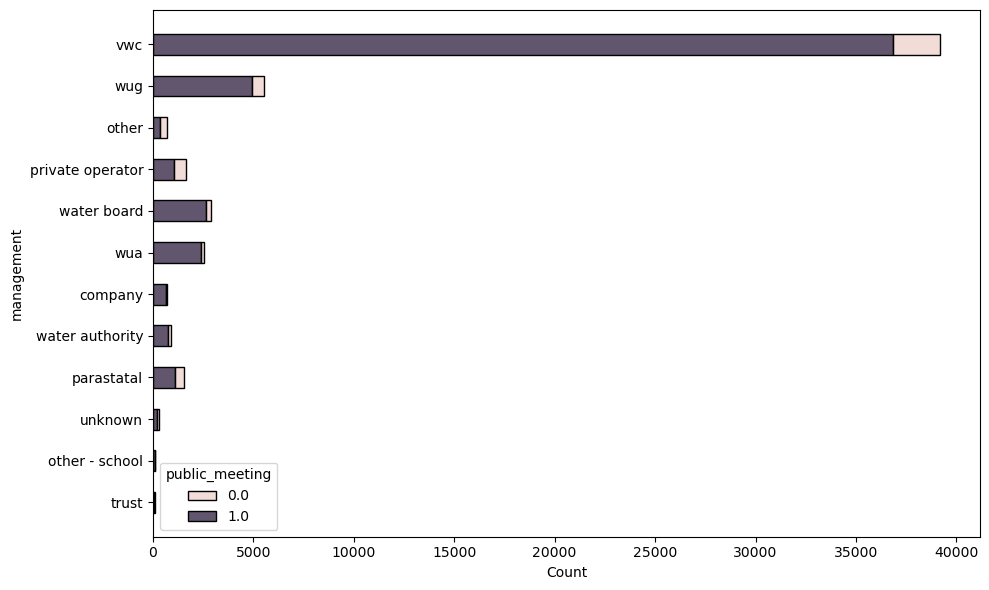

In [129]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, y="management",
             hue="public_meeting", multiple="stack", shrink=0.5)

plt.tight_layout()
plt.show()

Similarly, public meeting will be imputed.

In [130]:
# Group the dataframe by management and fill missing values in column scheme_management with the mode of each group
df['public_meeting'] = df.groupby('management')['public_meeting'].apply(lambda x: x.fillna(x.mode()[0]))

In [131]:
display_all(df.isnull().sum().sort_index()/len(df)*100)

amount_tsh                0.000000
basin                     0.000000
construction_year         0.000000
district_code             0.000000
extraction_type           0.000000
extraction_type_class     0.000000
extraction_type_group     0.000000
funder                    6.119529
gps_height                0.000000
id                        0.000000
installer                 6.153199
latitude                  0.000000
lga                       0.000000
longitude                 0.000000
management                0.000000
management_group          0.000000
num_private               0.000000
payment                   0.000000
payment_type              0.000000
permit                    0.000000
population                0.000000
public_meeting            0.000000
quality_group             0.000000
quantity                  0.000000
quantity_group            0.000000
recordDay                 0.000000
recordMonth               0.000000
recordYear                0.000000
recorded_by         

Funder and Installer data will be dropped as these columns present high cardinality. Scheme_name is mostly empty, therefore will be removed. Subvillage data has already contributed into the Latitude-Longitude data therefore will be removed.

Plot and Analyze Other Features

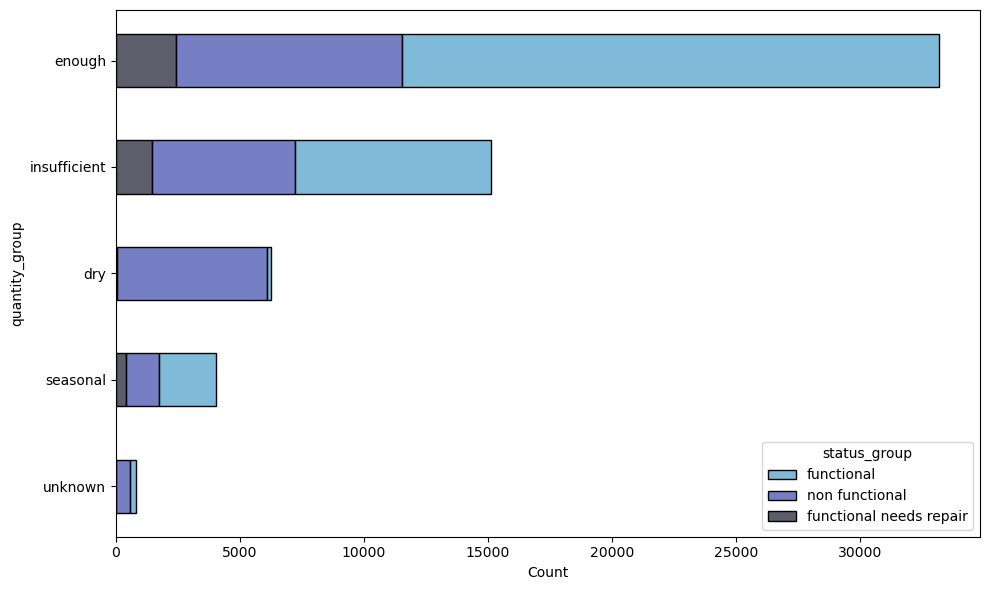

In [132]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, y="quantity_group",
             hue="status_group", multiple="stack", shrink=0.5)

plt.tight_layout()
plt.show()

Dry Water Pumps are almost non functional.

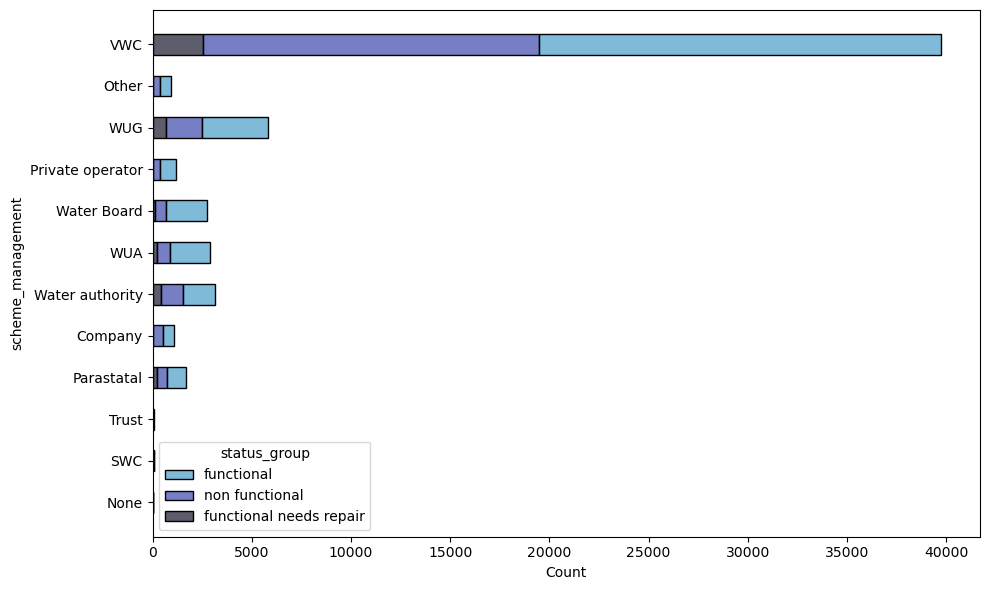

In [133]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, y="scheme_management",
             hue="status_group", multiple="stack", shrink=0.5)

plt.tight_layout()
plt.show()

Over 40k of water pumps is managed by VWC. 

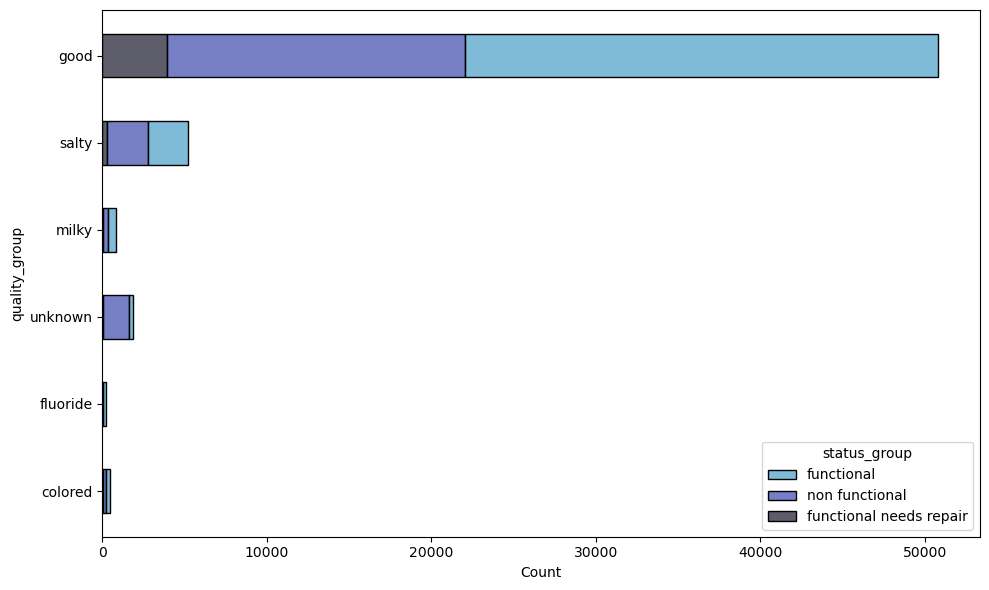

In [134]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, y="quality_group",
             hue="status_group", multiple="stack", shrink=0.5)

plt.tight_layout()
plt.show()


Over 50k of waterpumps has good quality of water. And high number of functional pumps lie in Good quality group.

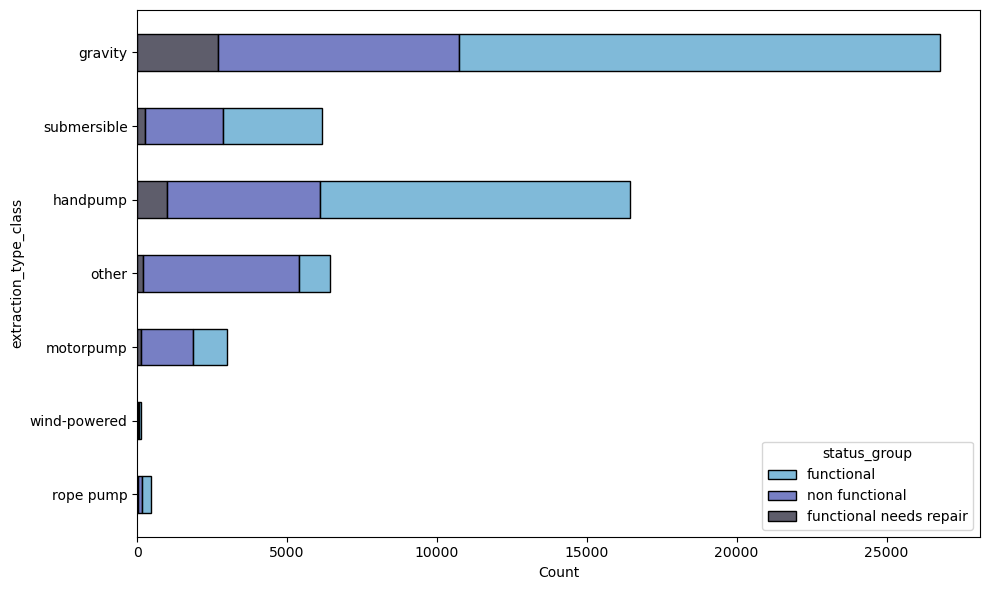

In [135]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, y="extraction_type_class",
             hue="status_group", multiple="stack", shrink=0.5)

plt.tight_layout()
plt.show()


The motorpumps and other pump types are have more non functional pumps ratio than gravity and hand style. 

Retriggering the Ydata report;

## Dropping Unnecessary Columns.

In [136]:
df.columns

Index(['id', 'amount_tsh', 'funder', 'gps_height', 'installer', 'longitude',
       'latitude', 'wpt_name', 'num_private', 'basin', 'subvillage', 'region',
       'region_code', 'district_code', 'lga', 'ward', 'population',
       'public_meeting', 'recorded_by', 'scheme_management', 'scheme_name',
       'permit', 'construction_year', 'extraction_type',
       'extraction_type_group', 'extraction_type_class', 'management',
       'management_group', 'payment', 'payment_type', 'water_quality',
       'quality_group', 'quantity', 'quantity_group', 'source', 'source_type',
       'source_class', 'waterpoint_type', 'waterpoint_type_group',
       'status_group', 'recordDay', 'recordMonth', 'recordYear'],
      dtype='object')

In [137]:
#Only has 1 unique value, so useless.
df.drop(['recorded_by'], axis=1, inplace=True)
#Has very high number of unique values, would hinder model consistency. Moreover, categorical and location based lga, subvillage, ward data has already contributed into Latitude-Longitude variable.
#Scheme_name 47.7% empty therefore will be removed.
df.drop(['funder', 'installer', 'lga', 'scheme_name', 'subvillage', 'ward', 'wpt_name', 'basin'], axis=1, inplace=True)
#Construction Year will be dropped since it is divided into seperate columns.
df.drop(['construction_year'], axis=1, inplace=True)
#Extraction type class and group are omitted since same as extraction type. As observed in the correlation matrix in YData profiling.
df.drop(['extraction_type_class','extraction_type_group'],axis=1, inplace=True)
#Amount_tsh is 70% empty, num_private 98.7% empty therefore will be removed.
df.drop(['amount_tsh','num_private'],axis=1, inplace=True)
#Management and management group are the same. When management is grouped by management_group, it is observed that no fractional groups remain in the management, therefore management_group can be removed. Also, this is observed in the scheme_management as well in imputations.
df.drop(['management', 'management_group'],axis=1, inplace=True)
#As observed in Ydata profiling and describe charts, WaterQuality/Quality Group , Quantity/Quantity group, Region/RegionCode, Source/SourceType/SourceClass, WaterpointType/Group, Payment/PaymentType repetitions are dropped.
df.drop(['water_quality', 'quantity', 'source_type', 'source', 'region', 'waterpoint_type_group', 'payment_type'],axis=1, inplace=True)


In [138]:
df.columns

Index(['id', 'gps_height', 'longitude', 'latitude', 'region_code',
       'district_code', 'population', 'public_meeting', 'scheme_management',
       'permit', 'extraction_type', 'payment', 'quality_group',
       'quantity_group', 'source_class', 'waterpoint_type', 'status_group',
       'recordDay', 'recordMonth', 'recordYear'],
      dtype='object')

## Dummification

In [139]:
list(df.select_dtypes(exclude=[np.number]))

['public_meeting',
 'scheme_management',
 'permit',
 'extraction_type',
 'quality_group',
 'quantity_group',
 'source_class',
 'waterpoint_type',
 'status_group']

In [140]:
dumdf = pd.get_dummies(df, columns=
['public_meeting',
 'scheme_management',
 'permit',
 
 'extraction_type',
 'quality_group',
 'quantity_group',
 'source_class',
 'waterpoint_type'])

dumdf.columns

Index(['id', 'gps_height', 'longitude', 'latitude', 'region_code',
       'district_code', 'population', 'payment', 'status_group', 'recordDay',
       'recordMonth', 'recordYear', 'public_meeting_False',
       'public_meeting_True', 'scheme_management_Company',
       'scheme_management_None', 'scheme_management_Other',
       'scheme_management_Parastatal', 'scheme_management_Private operator',
       'scheme_management_SWC', 'scheme_management_Trust',
       'scheme_management_VWC', 'scheme_management_WUA',
       'scheme_management_WUG', 'scheme_management_Water Board',
       'scheme_management_Water authority', 'permit_False', 'permit_True',
       'extraction_type_afridev', 'extraction_type_cemo',
       'extraction_type_climax', 'extraction_type_gravity',
       'extraction_type_india mark ii', 'extraction_type_india mark iii',
       'extraction_type_ksb', 'extraction_type_mono',
       'extraction_type_nira/tanira', 'extraction_type_other',
       'extraction_type_other - mk

In [141]:
dumdf.shape

(59400, 67)

In [142]:
dumdf.drop(columns=['public_meeting_False','permit_False'],inplace=True)

## SAVE TO CSV FILE

In [143]:
dumdf.to_csv("clean_train.csv", index=False)
